## Importing files

In [34]:
import sys
import os
cp = 'I:/My Drive/' #'/home/jupyter-gabriel/'
sys.path.append(cp + "projects/suyana")
from scripts.utils.functions import *

In [35]:
# Data primary path
dpp = cp + 'suyana/'
# Data inputs path
dip = cp + 'suyana/inputs/'
# Data features path
dfp = cp + 'suyana/features/'
# Data outputs path
dop = cp + 'suyana/outputs/'
# Data reports path
drp = cp + 'suyana/reports/'
# Data models path
dmp = cp + 'suyana/models/'
# Data displays path
ddp = cp +'suyana/displays/'
# Data geometries path
dgp = cp + 'suyana/geometries/'

## Select directory

In [36]:
path = dip
files_all = os.listdir(path)
files_ini = [f for f in files_all if f.startswith('PeruvianEEZ') and f.endswith('01')]
files_ini = sorted(files_ini)
files_ini

['PeruvianEEZ_20120101_20130101',
 'PeruvianEEZ_20130101_20140101',
 'PeruvianEEZ_20140101_20150101',
 'PeruvianEEZ_20150101_20160101',
 'PeruvianEEZ_20160101_20170101',
 'PeruvianEEZ_20170101_20180101',
 'PeruvianEEZ_20180101_20190101',
 'PeruvianEEZ_20190101_20200101',
 'PeruvianEEZ_20200101_20210101',
 'PeruvianEEZ_20210101_20220101',
 'PeruvianEEZ_20220101_20230101',
 'PeruvianEEZ_20230101_20240101',
 'PeruvianEEZ_20240101_20250101']

# Create and save dataframe

In [37]:
df = pd.DataFrame()
for i in range(13):
    df_aux = pd.read_csv(
        path+'/'+files_ini[i]+'/layer-activity-data-0/'+'public-global-fishing-effort-v3.0.csv',
    )
    df = pd.concat([df,df_aux], axis = 0)
    print(df.shape)

df.columns = ['lat', 'lon', 'date', 'flag', 'gearType', 'codVessel', 'fishingHours']

(225, 7)
(3892, 7)
(9829, 7)
(17904, 7)
(28955, 7)
(41697, 7)
(58905, 7)
(76258, 7)
(93541, 7)
(117155, 7)
(140123, 7)
(165759, 7)
(195801, 7)


In [38]:
# Convert latitudes and longitudes to decimal degrees
df['lat'] = np.round(df['lat'].astype(float),1)
df['lon'] = np.round(df['lon'].astype(float),1)
df['date'] = pd.to_datetime(df['date'])

In [39]:
# Convert date to datetime
df['date'] = pd.to_datetime(df['date'], format='%Y-%m-%d', errors='coerce')
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month

In [40]:
df.groupby('year').size()

year
2012      225
2013     3667
2014     5937
2015     8075
2016    11051
2017    12742
2018    17208
2019    17353
2020    17283
2021    23614
2022    22968
2023    25636
2024    30042
dtype: int64

In [41]:
df.to_parquet(dip + 'fishing_gfw_daily_2012_2024.parquet', compression='gzip')

In [16]:
#df.to_csv('I:/My Drive/suyana/data/data_gfw.csv', sep='|', index=False)

# Read stored data

In [4]:
df = pd.read_parquet('I:/My Drive/suyana/data/data_gfw.parquet')
df.head(3)

,lat,lon,date,flag,gearType,codVessel,fishingHours,year,month
0,-3.6,-81.6,2012-01-01,VEN,tuna_purse_seines,1,0.07,2012,1
1,-3.7,-81.6,2012-01-01,VEN,tuna_purse_seines,1,1.36,2012,1
2,-3.7,-81.5,2012-01-01,VEN,tuna_purse_seines,1,11.02,2012,1


Text(0, 0.5, '')

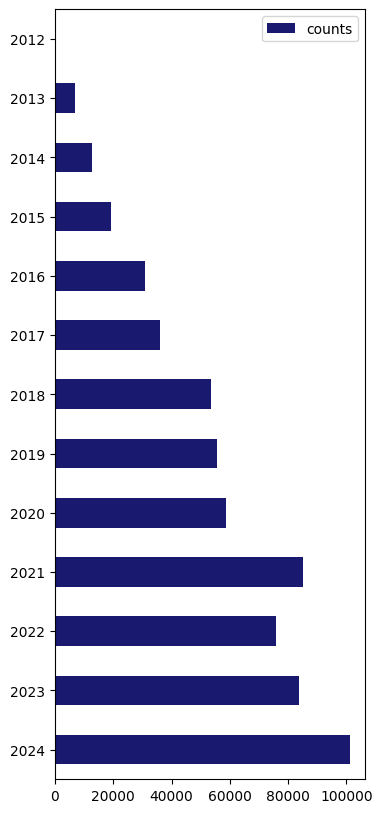

In [5]:
year_counts = df.groupby(['year']).size().reset_index(name="counts")
ax = year_counts.plot(kind="barh",x='year', stacked = False, figsize = (4,10), color='midnightblue')
ax.invert_yaxis()
ax.set_ylabel(None)

## Construct the Master Table For Shape

In [110]:
# Filter season dates
#df_mt = df[(df['date']>='2023-10-01') & (df['date']<='2024-01-01')]
df_mt = df[(df['date']>='2017-11-01')]
df_mt = df_mt[df_mt['flag'] == "PER"]
df_mt['season'] = np.where(
    df_mt['month'].isin([10,11,12,1]), 'verano', 
    np.where(
        df_mt['month'].isin([4,5,6,7,8]), 'invierno',
        'otro'
    )
) 

df_mt['season_year'] = (df_mt['date'] - pd.DateOffset(months=2)).dt.year

df_mt.groupby(['season', 'season_year']).size()

season    season_year
invierno  2018           19756
          2019           20927
          2020           21936
          2021           33531
          2022           37566
                         ...  
verano    2020           33722
          2021           26241
          2022           32253
          2023           38368
          2024           37084
Length: 23, dtype: int64

In [111]:
# Filter observations with at least 0.5 fishing hours
#df_mt = df_mt[df_mt['fishingHours']>=0.5]

#Filter observations that belong to the summer season
df_mt = df_mt[df_mt['season']=='verano']

# Group by lat, lon, season
df_mt = df_mt.groupby(['lat', 'lon', 'season_year', 'season']).agg(
    fishingHours = ('fishingHours', 'sum'),
    nCount = ('fishingHours', 'count'),
    nMonths = ('month', 'nunique')
).assign(
    fishingDays = lambda x: np.round(x['fishingHours']/24,2),
    #fishingHoursPerMonth = lambda x: x['fishingHours']/x['nMonths'],
    logFishingHours = lambda x: np.log(x['fishingHours']),
    logFishinDays = lambda x: np.log(x['fishingDays']),
    flagOne = 1
).reset_index()

c:\Users\98acg\AppData\Local\Programs\Python\Python313\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [8]:
df_mt.to_csv("I:/My Drive/suyana/data/fishing_distribution.csv", sep='|', index=False)

In [112]:
df_final = df_mt.groupby(['lat', 'lon', 'season']).agg(
    fishingHours = ('fishingHours', 'sum'),
    fishingDays = ('fishingDays', 'sum'),
    meanFishingHours = ('fishingHours', 'mean'),
    meanFishingDays = ('fishingDays', 'mean'),
    #medianFishingHoursPerMonth = ('fishingHoursPerMonth', 'median'),
    flagOne = ('flagOne', 'max')
).reset_index()

df_final = create_quantile_col(df_final, 'cuantilDays', 'meanFishingDays', 100, True)
df_final = create_quantile_col(df_final, 'cuantilHours', 'meanFishingHours', 100, True)
df_final = create_quantile_col(df_final, 'decilDays', 'meanFishingDays', 10, True)
df_final = create_quantile_col(df_final, 'decilHours', 'meanFishingHours', 10, True)

df_final['logFishingHours'] = np.log(df_final['fishingHours'])
df_final['logFishingDays'] = np.log(df_final['fishingDays'])

#df_final['lonTimesFishing'] = df_final['lon']*df_final['medianFishingHoursPerMonth']
#df_final['sumfishingHoursPerMonth'] = df_final.groupby('lat')['medianFishingHoursPerMonth'].transform('sum')
#df_final['lonTimesFishing'] = df_final['lonTimesFishing']/df_final['sumfishingHoursPerMonth']
df_final.head(3)

c:\Users\98acg\AppData\Local\Programs\Python\Python313\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


,lat,lon,season,fishingHours,fishingDays,meanFishingHours,meanFishingDays,flagOne,cuantilDays,cuantilHours,decilDays,decilHours,logFishingHours,logFishingDays
0,-19.9,-73.8,verano,1.67,0.07,1.67,0.07,1,23,23,3,3,0.512824,-2.659260
1,-19.8,-73.7,verano,1.01,0.04,1.01,0.04,1,12,14,2,2,0.009950,-3.218876
2,-19.8,-73.6,verano,1.40,0.06,1.40,0.06,1,20,21,2,3,0.336472,-2.813411


In [10]:
df_final.groupby('decilHours').agg(n = ('meanFishingHours','min'), N = ('meanFishingHours','max')).reset_index()

,decilHours,n,N
0,1,0.010,0.740000
1,2,0.740,1.385000
2,3,1.385,2.255000
3,4,2.265,3.505000
4,5,3.510,5.280000
5,6,5.288,7.880000
6,7,7.880,12.570000
7,8,12.570,24.096667
8,9,24.105,51.038000
9,10,51.210,2743.805000


## Read the geojson file

In [11]:
df_geo = gpd.read_file('C:/Files/!suyana/data/peruvianEEZ_20230101_20240101/layer-reference-geometry/geometry.geojson')

Skipping field bbox: unsupported OGR type: 3


In [12]:
# Get the centroid of the polygon
df_geo.geometry.centroid
# Get the bounds of the polygon
df_geo.geometry.bounds #geometry.total_bounds for getting an array

C:\Users\98acg\AppData\Local\Temp\ipykernel_12400\2933765590.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  df_geo.geometry.centroid


,minx,miny,maxx,maxy
0,-84.67071,-20.20814,-70.28108,-3.39212


In [13]:
x_lims = [df_geo.geometry.bounds['minx'], df_geo.geometry.bounds['maxx']]
y_lims = [df_geo.geometry.bounds['miny'], df_geo.geometry.bounds['maxy']]

In [14]:
df_coast = pd.read_csv("C:/Files/!suyana/data/coast_peru.csv", names=['lon', 'lat'])

In [15]:
df_coast_tuple = list(zip(df_coast['lon'], df_coast['lat']))
df_coast_tuple[:2]

[(-70.29898, -18.29238), (-70.32414, -18.26649)]

<Axes: >

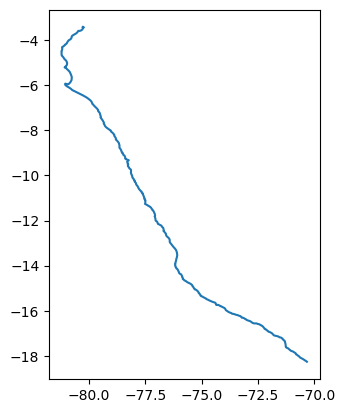

In [16]:
gdf_coast = gpd.GeoSeries([
    LineString(df_coast_tuple)
],)
gdf_coast.plot()

## Plot the distribution of hours

In [100]:
def create_static_heatmap(df, df_geo, x_lims, y_lims, intensity_col):
    # Create a grid for heatmap
    x = df["lon"]
    y = df["lat"]
    weights = df[intensity_col]

    # Define the grid resolution
    x_edges = np.linspace(x_lims[0], x_lims[1], 200)[:,0]
    y_edges = np.linspace(y_lims[0], y_lims[1], 200)[:,0]

    # Compute a 2D histogram
    heatmap, xedges, yedges = np.histogram2d(x, y, bins=[x_edges, y_edges], weights=weights)

    fig, ax = plt.subplots(figsize=(10, 8))

    # Plot GeoJSON borders
    df_geo.boundary.plot(ax=ax, color="black", linewidth=1)

    # Add background map
    cx.add_basemap(ax, crs=df_geo.crs, source=cx.providers.CartoDB.PositronNoLabels)

    # Overlay heatmap
    extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
    im = ax.imshow(
        heatmap.T, 
        extent=extent, 
        origin="lower", 
        cmap=custom_cmap, 
        alpha=0.6,  # Transparency
    )

    # Add colorbar
    cbar = plt.colorbar(im, ax=ax)

    cbar.set_label(intensity_col)

    ax.set_title("Fishing Intensity in Peruvian EEZ")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    plt.show()


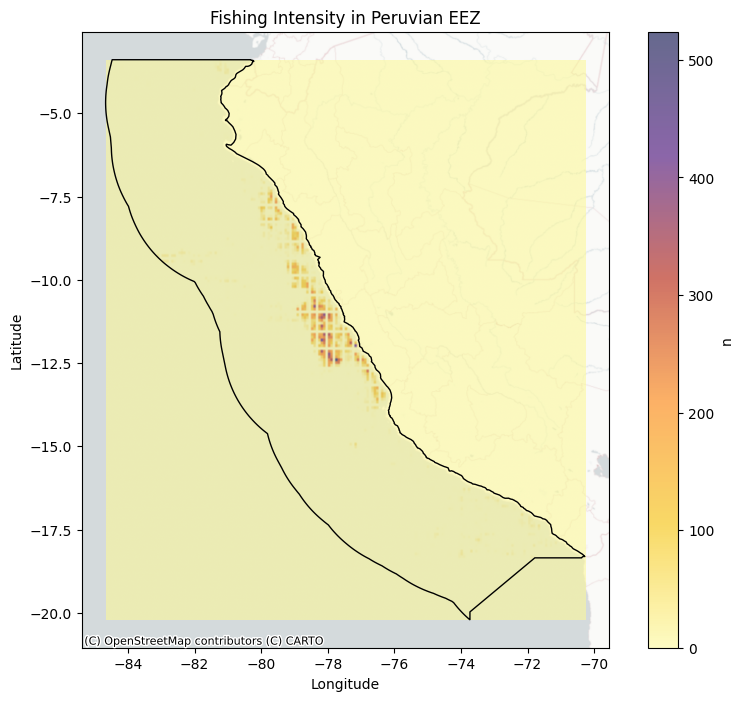

In [102]:
create_static_heatmap(df_mt, df_geo, x_lims, y_lims, "n")

<Axes: xlabel='fishingHours', ylabel='Count'>

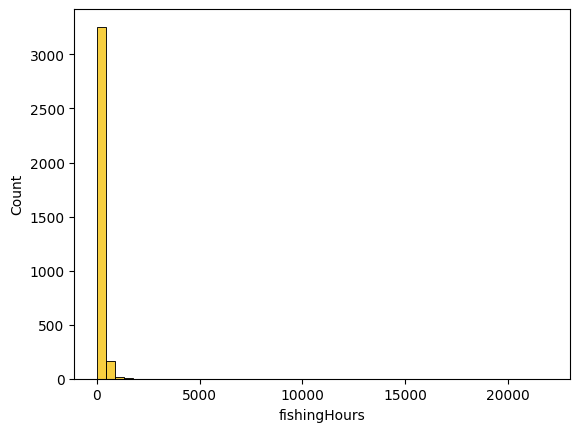

In [145]:
sns.histplot(data = df_mt, x = "fishingHours", bins = 50)

# Create Scatterplot with background

In [17]:
df_geo = gpd.read_file('C:/Files/!suyana/data/peruvianEEZ_20230101_20240101/layer-reference-geometry/geometry.geojson')
x_lims = [df_geo.geometry.bounds['minx'], df_geo.geometry.bounds['maxx']]
y_lims = [df_geo.geometry.bounds['miny'], df_geo.geometry.bounds['maxy']]

Skipping field bbox: unsupported OGR type: 3


In [18]:
from matplotlib.colors import LinearSegmentedColormap

from matplotlib.colors import ListedColormap

import contextily as cx

# Define custom colors
list_colors = ["#fcf99a", "#f5c000", "#fa7d00", "#b01500", "#3e0070", "#000642"]
custom_cmap = LinearSegmentedColormap.from_list("custom_cmap", list_colors)

#custom_cmap = ListedColormap(list_colors)
#df_geo.crs #.to_string()

In [31]:
def create_heatmap_w_bg(df, df_geo, x_lims, y_lims, intensity_col, log_intensity=True, label_bar="Fishing Intensity"):
    # Create a grid for heatmap
    x = df["lon"]
    y = df["lat"]
    #weights = df[intensity_col]

    # Define the grid resolution
    x_edges = np.linspace(x_lims[0], x_lims[1], 100)[:,0]
    y_edges = np.linspace(y_lims[0], y_lims[1], 100)[:,0]

    # Create template for figure
    fig, ax = plt.subplots(figsize=(10, 6))

    # Plot geojson borders from geometry file
    df_geo.boundary.plot(ax=ax, color="black", linewidth=1)

    gdf_coast.plot(ax=ax, color="blue", linewidth=2)

    # Add background map
    cx.add_basemap(ax, crs=df_geo.crs, source=cx.providers.CartoDB.PositronNoLabels)
    
    if log_intensity:
        weights = np.log(df[intensity_col])
    else:
        weights = df[intensity_col]

    # Plot the scatterplot
    sc = ax.scatter(
        df["lon"],
        df["lat"],
        c=weights,  # Color by intensity
        cmap=custom_cmap,      # Color map
        s=10,              # Size of points
        #edgecolor="black",  # Point border color
        alpha=0.8,          # Transparency
    )

    # Add a colorbar
    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label(label_bar)

    # Customize the plot
    ax.set_title("Fishing Intensity in Peruvian EEZ")
    #ax.set_xlabel("Longitude")
    #ax.set_ylabel("Latitude")
    ax.grid(True)
    # Apply the formatters to the x and y axes
    ax.xaxis.set_major_formatter(FuncFormatter(format_longitude))
    ax.yaxis.set_major_formatter(FuncFormatter(format_latitude))

    # Change the tick parameters for better visibility
    ax.tick_params(axis='x', labelcolor='gray', labelsize=8)
    ax.tick_params(axis='y', labelcolor='gray', labelsize=8)
    plt.show()

In [32]:
coords = df_geo.boundary.apply(lambda x: x.coords)
coords = coords.explode()

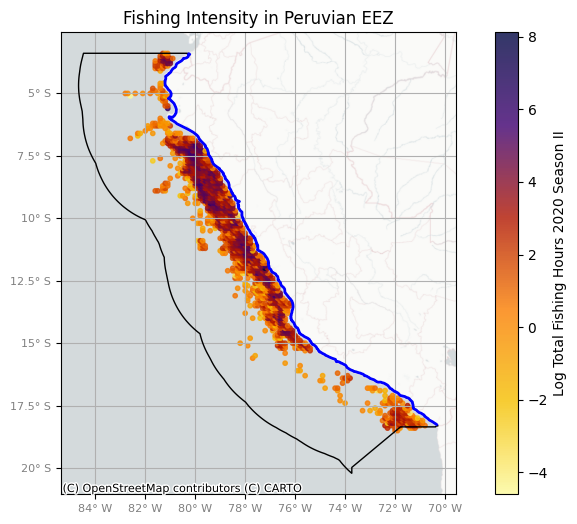

In [33]:
create_heatmap_w_bg(
    df_mt.query('season_year == 2020'), 
    df_geo, 
    x_lims, 
    y_lims, 
    "fishingHours", 
    True,
    "Log Total Fishing Hours 2020 Season II"
)

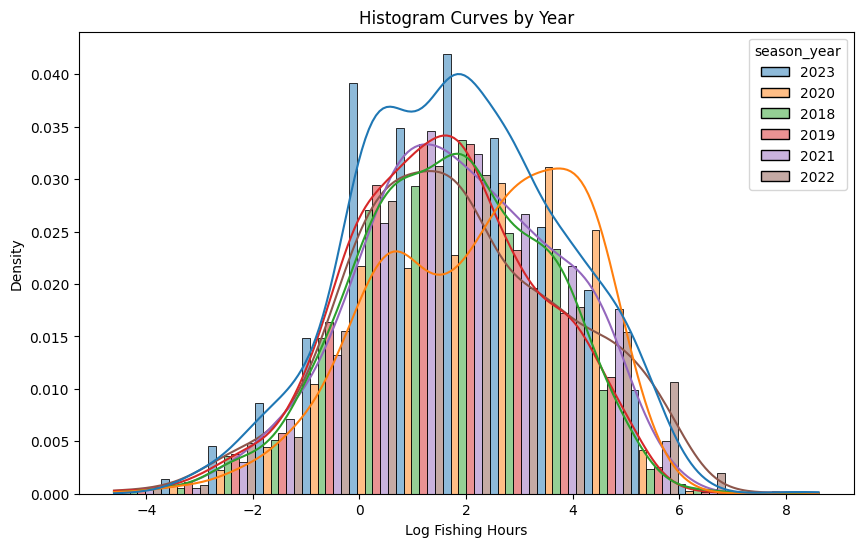

In [34]:
# Create the histogram curves by year
df_aux = df_mt[(df_mt['season_year']>2017) & (df_mt['season_year']<2024)].copy()
df_aux['season_year'] = df_aux['season_year'].astype(str)
plt.figure(figsize=(10, 6))
sns.histplot(data=df_aux, x='logFishingHours', hue='season_year', kde=True, stat='density',bins=15, multiple='dodge')

plt.title('Histogram Curves by Year')
plt.xlabel('Log Fishing Hours')
plt.ylabel('Density')
plt.show()

# Create geometry distribution

In [37]:
#df_coords = df_final[(df_final['medianFishingHoursPerMonth']>10) & (df_final['lonMaxValue'] == 1)]
#df_coords = df_final.groupby('lat').agg(
#    lon = ('lonTimesFishing', 'sum')
#).reset_index()
#df_coords = df_coords[['lat', 'lon']].drop_duplicates()
df_coords = df_final[['lat', 'lon']].drop_duplicates()
df_coords.head(2)

,lat,lon
0,-19.9,-73.8
1,-19.8,-73.7


In [38]:
df_coords_tuple = list(zip(df_coords['lon'], df_coords['lat']))
df_coords_tuple[:2]

[(-73.8, -19.9), (-73.7, -19.8)]

In [39]:
geom = gpd.GeoSeries([
    LineString(df_coords_tuple)
],
)

In [40]:
list_dist = []
list_lon = []
list_lat = []
for p in df_coords_tuple:
    point = Point(p)
    dist = float(gdf_coast.distance(point))
    list_dist.append(dist)
    list_lon.append(p[0])
    list_lat.append(p[1])

df_dist = pd.DataFrame({
    'lon': list_lon,
    'lat': list_lat,
    'distance': list_dist,
})

df_dist.describe()

C:\Users\98acg\AppData\Local\Temp\ipykernel_12400\1226428847.py:6: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  dist = float(gdf_coast.distance(point))


,lon,lat,distance
count,3650.000000,3650.000000,3650.000000
mean,-78.130932,-11.913890,1.271006
std,3.046923,4.151277,0.834566
min,-84.600000,-19.900000,0.032486
25%,-80.400000,-15.500000,0.586990
50%,-78.600000,-12.000000,1.111759
75%,-76.200000,-8.800000,1.816789
max,-70.400000,-3.400000,3.967209


In [113]:
df_final_w_distance = df_final.merge(
    df_dist,
    how = 'left',
    on = ['lon', 'lat']
)

In [114]:
##CUMULATIVE DISTRIBUTION OF DISTANCE WEIGHTED ON MEAN FISHING HOURS
# Step 1: Sort the DataFrame by distance
df_final_w_distance = df_final_w_distance.sort_values('distance').reset_index(drop=True)
# Step 2: Compute the weighted cumulative sum for var_B
df_final_w_distance["cumsumMFH"] = df_final_w_distance["meanFishingHours"].cumsum() / df_final_w_distance["meanFishingHours"].sum()


# Step 3: Assign quantiles to var_A based on the weighted cumulative sum
#df_final_w_distance["percentilDistancia"] = pd.cut(
#    df_final_w_distance["distance"], 
#    bins=quantile_cutoffs,  # Equal intervals for quantiles
#    labels=range(1, 100 + 1),        # Label quantiles as integers
#    include_lowest=True
#)
#df_final_w_distance = create_quantile_col(df_final_w_distance,'cuantilMFH','cumsumMFH',100,True)
df_final_w_distance['percentilMFH'] = np.round(df_final_w_distance["cumsumMFH"]*100,0)
df_final_w_distance['decilMFH'] = np.round(df_final_w_distance["cumsumMFH"]*10,0)

In [116]:
df_final_w_distance.to_csv("I:/My Drive/suyana/data/distribution_fishing_hours.csv", sep='|', index=False)

In [85]:
df_final_w_distance.groupby('decilMFH').agg(
    count = ("distance", "count"),
    minDistance = ("distance", "min"),
    maxDistance = ("distance", "max"),
    minSumMFH = ("cumsumMFH", "min"),
    maxSumMFH = ("cumsumMFH", "max")
)

,count,minDistance,maxDistance,minSumMFH,maxSumMFH
decilMFH,,,,,
0.0,99,0.032486,0.158704,0.000024,0.029671
1.0,144,0.159149,0.234559,0.073071,0.149490
2.0,129,0.234690,0.304529,0.150690,0.249363
3.0,158,0.305117,0.382723,0.250482,0.349820
4.0,217,0.384107,0.498614,0.350033,0.449812
5.0,248,0.498822,0.633074,0.450336,0.549859
6.0,306,0.633991,0.798455,0.550166,0.649121
7.0,288,0.799485,0.959310,0.650134,0.749820
8.0,363,0.960849,1.198767,0.750208,0.849918


In [74]:
quantile_cutoffs = np.interp(
    np.linspace(0, 1, 100+1),  # Quantile positions
    df_final_w_distance["cumsumMFH"],                # Weighted CDF
    df_final_w_distance["distance"]                           # Corresponding var_A values
)
len(quantile_cutoffs)
print(min(quantile_cutoffs),max(quantile_cutoffs))

0.03248614576736736 3.9672088052180934


In [115]:
df_final_w_distance.head(9)

,lat,lon,season,fishingHours,fishingDays,meanFishingHours,meanFishingDays,flagOne,cuantilDays,cuantilHours,decilDays,decilHours,logFishingHours,logFishingDays,distance,cumsumMFH,percentilMFH,decilMFH
0,-12.2,-76.9,verano,4.53,0.19,1.510000,0.063333,1,22,22,3,3,1.510722,-1.660731,0.032486,0.000024,0.0,0.0
1,-13.8,-76.2,verano,7.31,0.30,1.827500,0.075000,1,25,25,3,3,1.989243,-1.203973,0.057439,0.000053,0.0,0.0
2,-12.0,-77.1,verano,276.90,11.55,34.612500,1.443750,1,85,85,9,9,5.623656,2.446685,0.059445,0.000600,0.0,0.0
3,-17.0,-72.0,verano,23.98,0.99,7.993333,0.330000,1,61,61,7,7,3.177220,-0.010050,0.059510,0.000727,0.0,0.0
4,-7.7,-79.4,verano,71.77,2.98,10.252857,0.425714,1,66,66,7,7,4.273467,1.091923,0.062765,0.000889,0.0,0.0
5,-18.1,-70.7,verano,1.58,0.07,1.580000,0.070000,1,23,22,3,3,0.457425,-2.659260,0.065985,0.000914,0.0,0.0
6,-9.0,-78.6,verano,26.18,1.10,3.272500,0.137500,1,39,39,4,4,3.264996,0.095310,0.070406,0.000966,0.0,0.0
7,-18.3,-70.4,verano,4.43,0.18,4.430000,0.180000,1,46,47,5,5,1.488400,-1.714798,0.074704,0.001036,0.0,0.0
8,-13.7,-76.2,verano,1.08,0.05,1.080000,0.050000,1,18,16,2,2,0.076961,-2.995732,0.077083,0.001053,0.0,0.0


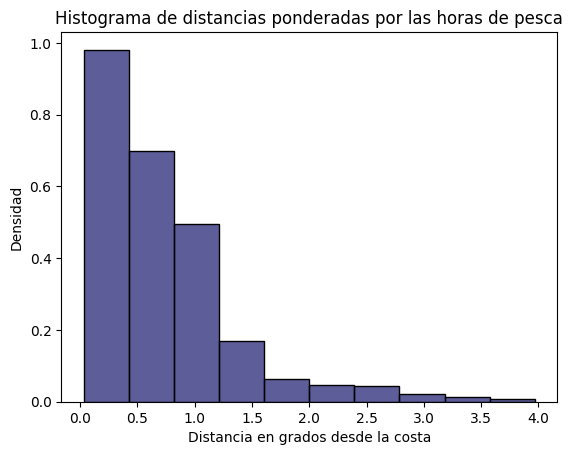

In [305]:
# Create a weighted histogram
sns.histplot(df_final_w_distance, x='distance', bins=10, 
             weights='meanFishingHours',
             alpha=0.7, stat='density',
             color = 'midnightblue')

plt.title('Histograma de distancias ponderadas por las horas de pesca')
plt.xlabel('Distancia en grados desde la costa')
plt.ylabel('Densidad')
plt.show()

In [294]:
df_final_w_distance.to_csv("I:/My Drive/suyana/data/distance_fishing_distribution.csv", sep ='|')

## Plot distance from coastline

In [275]:
def create_heatmap_w_bg(df, df_geo, x_lims, y_lims, intensity_col, log_intensity=True):
    # Create a grid for heatmap
    x = df["lon"]
    y = df["lat"]
    #weights = df[intensity_col]

    # Define the grid resolution
    x_edges = np.linspace(x_lims[0], x_lims[1], 100)[:,0]
    y_edges = np.linspace(y_lims[0], y_lims[1], 100)[:,0]

    # Create template for figure
    fig, ax = plt.subplots(figsize=(8, 6))

    # Plot geojson borders from geometry file
    df_geo.boundary.plot(ax=ax, color="black", linewidth=1)

    gdf_coast.plot(ax=ax, color="blue", linewidth=2)

    geom.plot(ax=ax, color="red", linewidth=1)

    # Add background map
    cx.add_basemap(ax, crs=df_geo.crs, source=cx.providers.CartoDB.PositronNoLabels)
    
    if log_intensity:
        weights = np.log(df[intensity_col])
    else:
        weights = df[intensity_col]

    # Plot the scatterplot
    sc = ax.scatter(
        df["lon"],
        df["lat"],
        c=weights,  # Color by intensity
        cmap=custom_cmap,      # Color map
        s=10,              # Size of points
        #edgecolor="black",  # Point border color
        alpha=0.8,          # Transparency
    )

    # Add a colorbar
    cbar = plt.colorbar(sc, ax=ax)
    #cbar.set_label(intensity_col)

    # Customize the plot
    ax.set_title("Fishing Intensity in Peruvian EEZ")
    #ax.set_xlabel("Longitude")
    #ax.set_ylabel("Latitude")
    ax.grid(True)
    # Apply the formatters to the x and y axes
    ax.xaxis.set_major_formatter(FuncFormatter(format_longitude))
    ax.yaxis.set_major_formatter(FuncFormatter(format_latitude))

    # Change the tick parameters for better visibility
    ax.tick_params(axis='x', labelcolor='gray', labelsize=8)
    ax.tick_params(axis='y', labelcolor='gray', labelsize=8)
    plt.show()

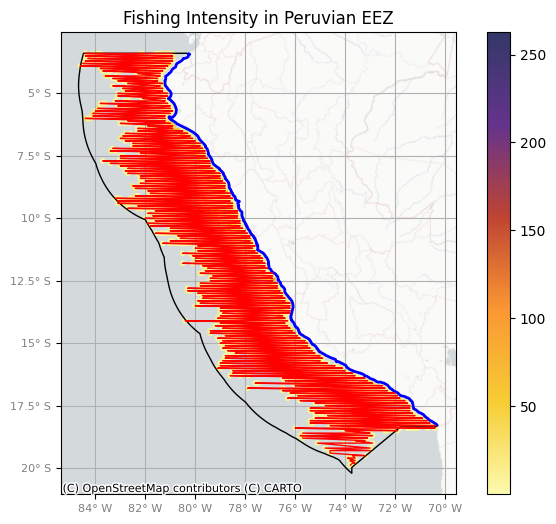

In [276]:
create_heatmap_w_bg(
    df_final[df_final['fishingHours']<1000], df_geo, x_lims, y_lims, "medianFishingHoursPerMonth", False
)

In [103]:
np.quantile(df_dist['distance'], 0.5)

np.float64(0.8921154375505627)

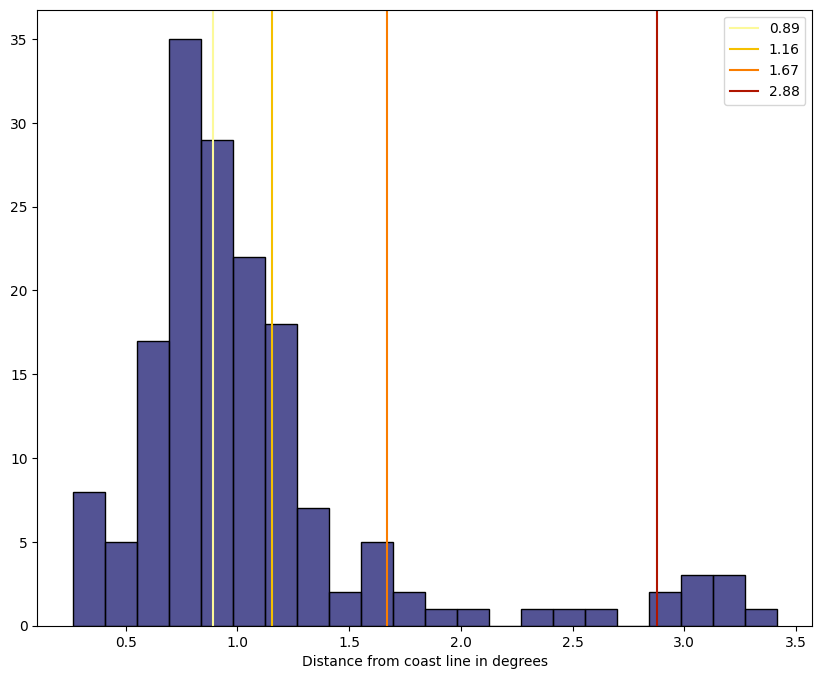

In [115]:
quant_ticks = [0.5, 0.75, 0.9, 0.95]

list_quant = [np.quantile(df_dist['distance'], i) for i in quant_ticks]

fig, ax = plt.subplots(figsize=(10, 8))

sns.histplot(df_dist, x = 'distance', color = "midnightblue")
ax.set_xlabel("Distance from coast line in degrees")
ax.set_ylabel(None)

for i in range(len(list_quant)):
    ax.axvline(list_quant[i], color = list_colors[i], label = f'{list_quant[i]:.2f}')
ax.legend()

## Create a dynamic Heatmap with Folium

In [124]:
from folium.plugins import HeatMap
def create_heatmap(df, zoomstart = 5):
    # Create a base map
    m = folium.Map(location=[df["lat"].mean(), df["lon"].mean()], zoom_start=zoomstart)

    # Add heatmap layer
    heat_data = [[row['lat'], row['lon'], row['fishingHours']] for index, row in df.iterrows()]
    HeatMap(heat_data).add_to(m)

    # Save or display map
    #m.save("heatmap.html")
    return m

In [125]:
map1 = create_heatmap(df_mt, 4)
map1

In [126]:
map2 = create_heatmap(df_mt[df_mt['fishingHours']>1.5], 4)
map2

In [127]:
df_mt[df_mt['fishingHours']<0.01]

,lat,lon,date,flag,gearType,codVessel,fishingHours,year,month,season
11329,-17.6,-73.4,2018-08-01,PER,other_purse_seines,1,0.0,2018,8,invierno
15486,-13.8,-76.3,2018-07-01,PER,inconclusive,1,0.0,2018,7,invierno
19221,-17.6,-71.5,2018-03-01,PER,other_purse_seines,1,0.0,2018,3,otro
26020,-13.8,-76.3,2018-05-01,PER,inconclusive,1,0.0,2018,5,invierno
42146,-11.6,-78.8,2018-12-01,PER,tuna_purse_seines,1,0.0,2018,12,verano
...,...,...,...,...,...,...,...,...,...,...
81561,-9.7,-79.6,2024-12-01,PER,purse_seines,1,0.0,2024,12,verano
87473,-8.2,-79.2,2024-11-01,PER,fishing,1,0.0,2024,11,verano
96355,-18.1,-70.8,2024-05-01,PER,set_longlines,1,0.0,2024,5,invierno
98592,-9.1,-78.6,2024-03-01,PER,fishing,1,0.0,2024,3,otro
